In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import model as modellib
import pandas as pd
import cv2
import numpy as np
from inference_config import inference_config
from bowl_dataset import BowlDataset
import visualize
import matplotlib.pyplot as plt

%matplotlib inline

Using TensorFlow backend.



Configurations:
BACKBONE_SHAPES                [[128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]
 [  8   8]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        512
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  512
IMAGE_MIN_DIM                  256
IMAGE_PADDING                  True
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.01
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               500
MEAN_PIXEL                     [0, 0, 0]
MINI_MASK_SHAPE                (56, 56)
NAME                           nucleos
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAINING         2000


In [2]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [4]:
ROOT_DIR = os.getcwd()
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()[1]
model_path = 'mask_rcnn_weights.h5'

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

dataset_test = BowlDataset()
dataset_test.load_bowl('stage1_test')
dataset_test.prepare()

sample_submission = pd.read_csv('stage1_sample_submission.csv')

Loading weights from  mask_rcnn_weights.h5


Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   79.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   79.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


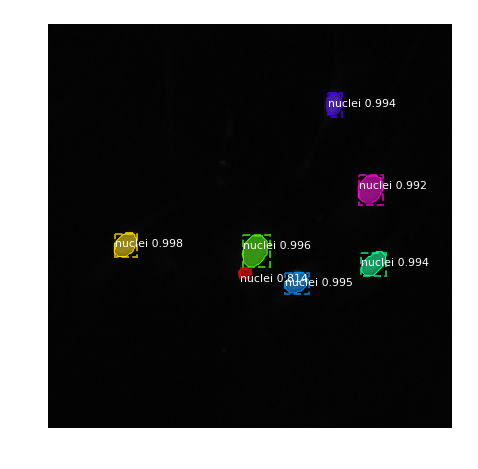

Processing 1 images
image                    shape: (519, 253, 3)         min:   11.00000  max:  242.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  241.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


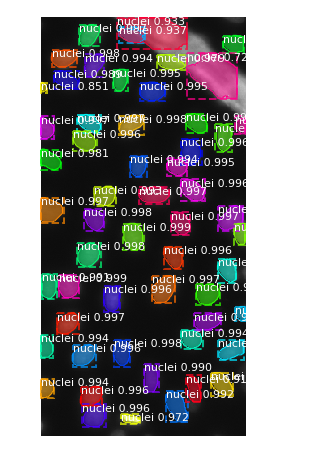

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


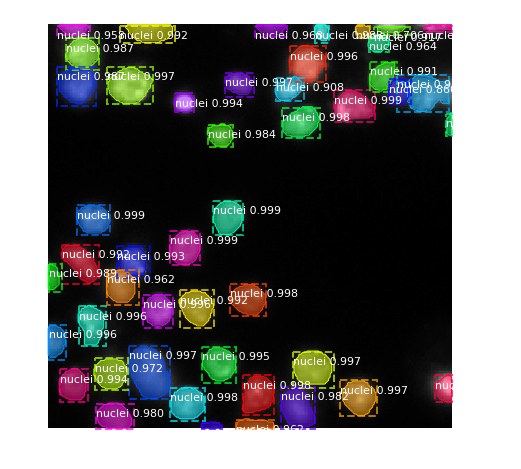

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


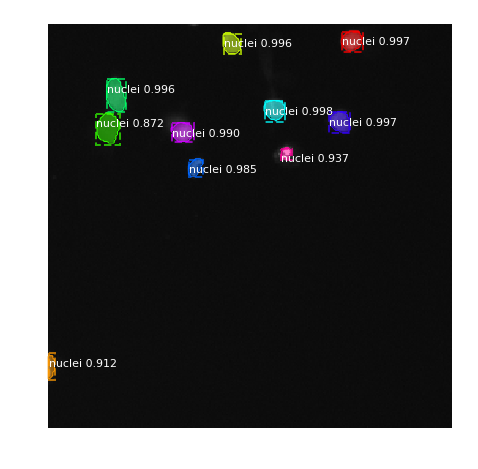

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


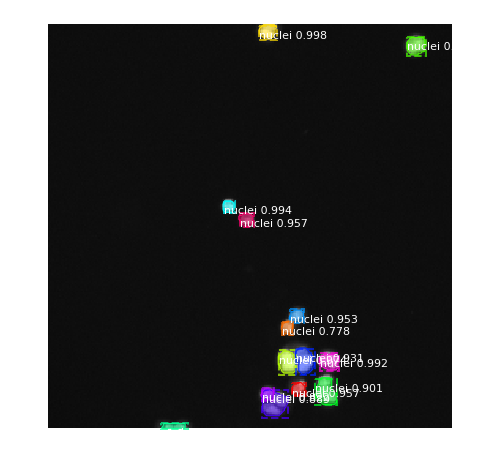

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


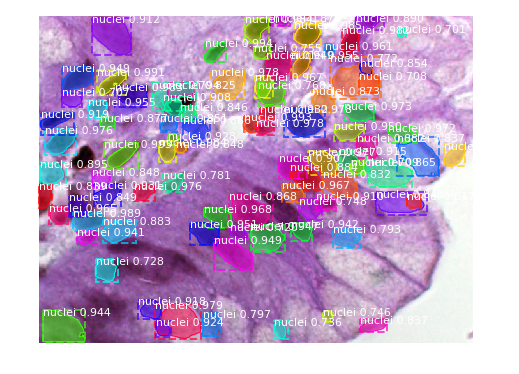

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  192.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  169.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


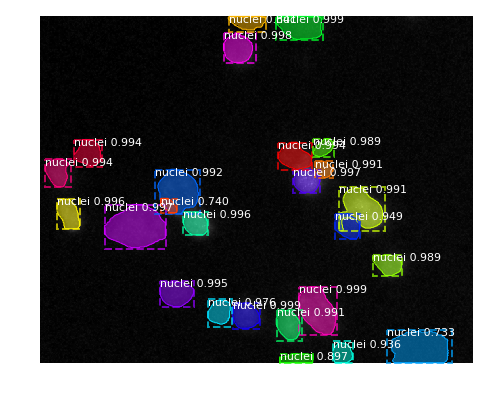

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


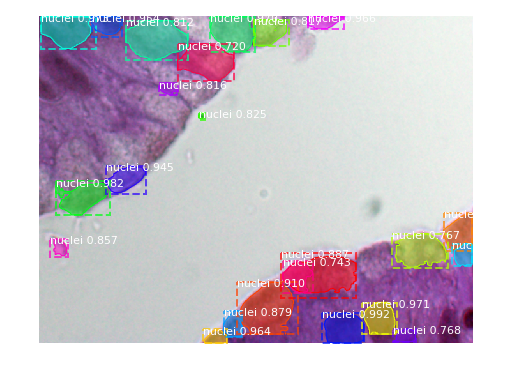

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:   76.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   72.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


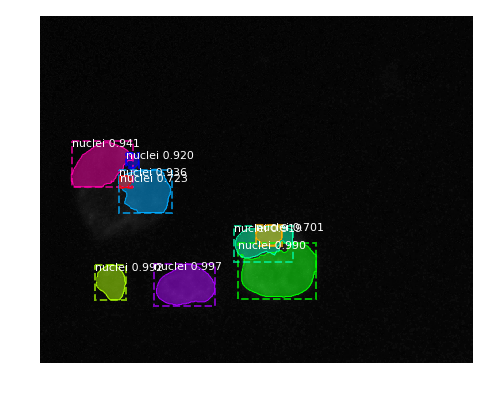

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  108.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  108.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


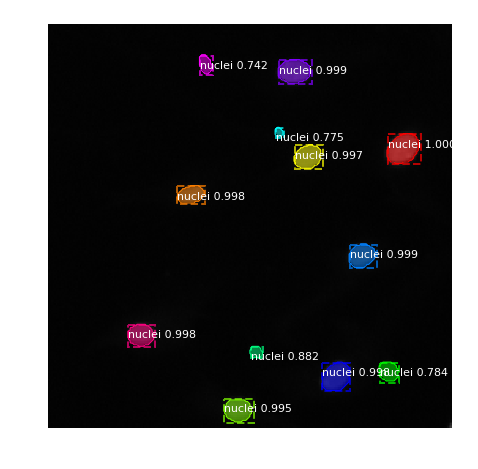

Processing 1 images
image                    shape: (519, 162, 3)         min:    1.00000  max:  205.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  200.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


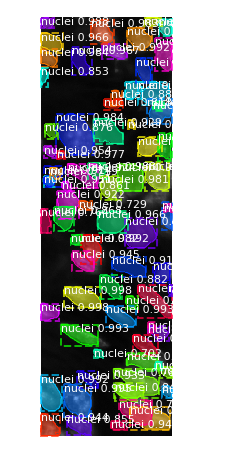

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  126.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  114.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


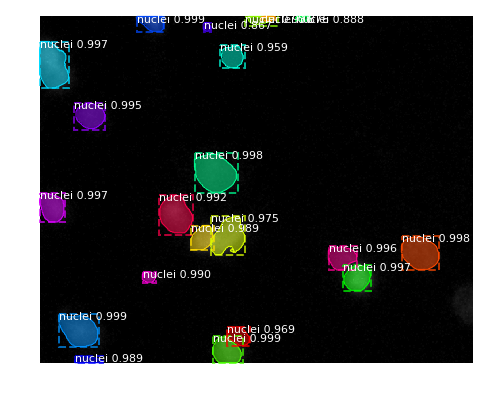

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


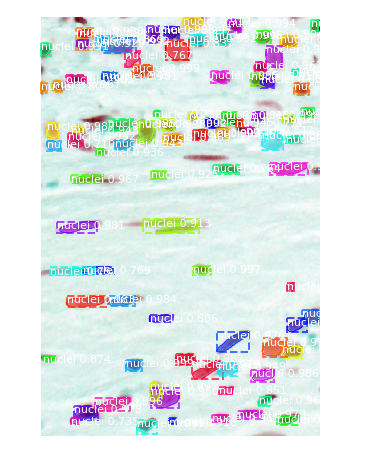

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


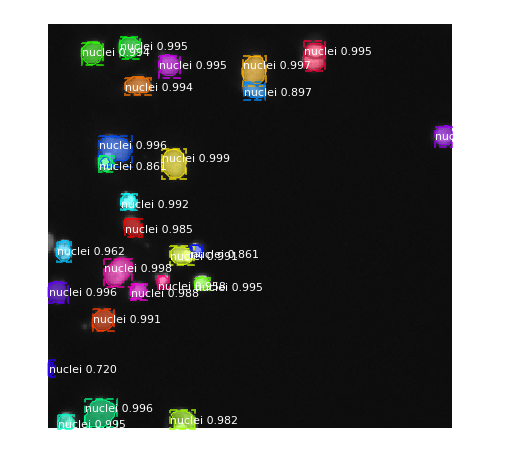

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  252.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


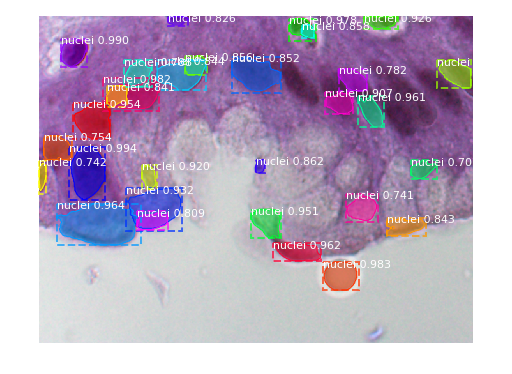

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


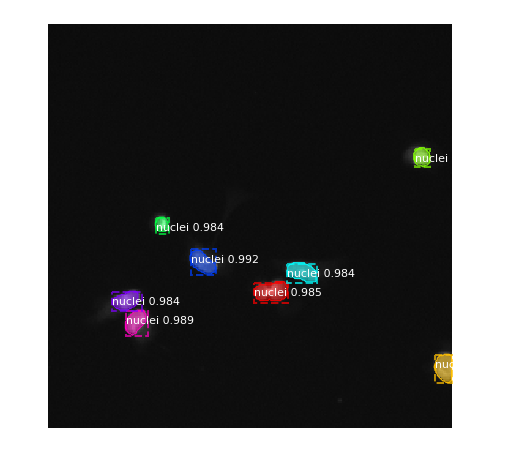

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


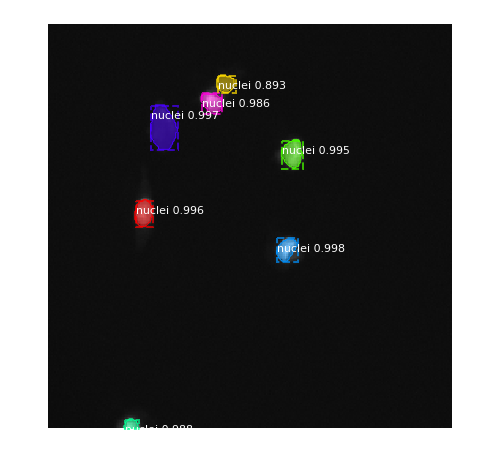

Processing 1 images
image                    shape: (519, 253, 3)         min:   11.00000  max:  211.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  211.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


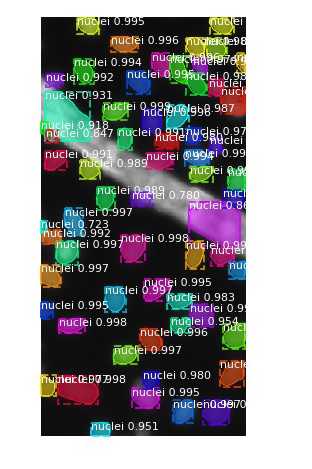

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  101.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  101.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


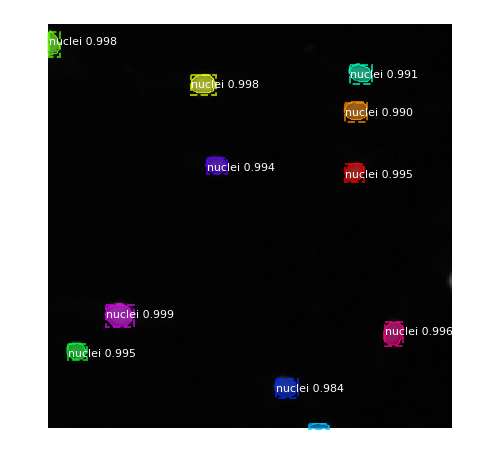

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


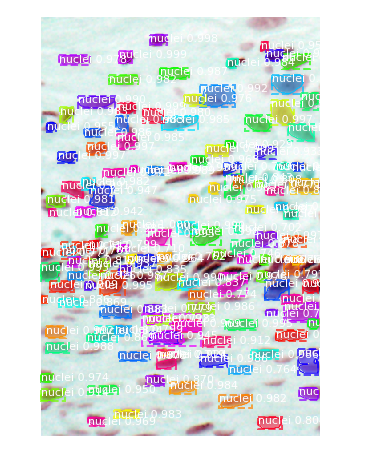

Processing 1 images
image                    shape: (520, 348, 3)         min:    5.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


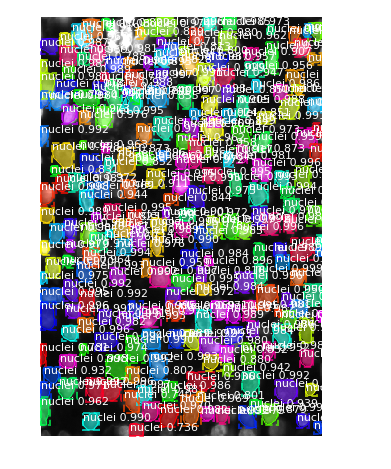

Processing 1 images
image                    shape: (260, 347, 3)         min:    2.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  429.00000


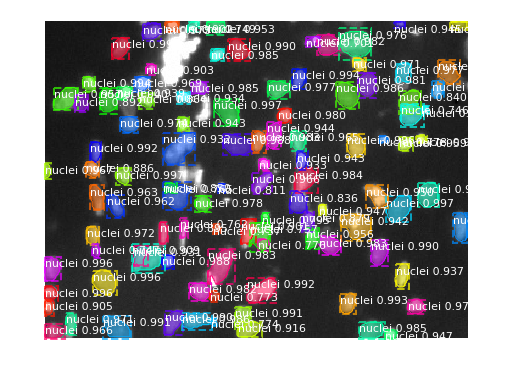

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


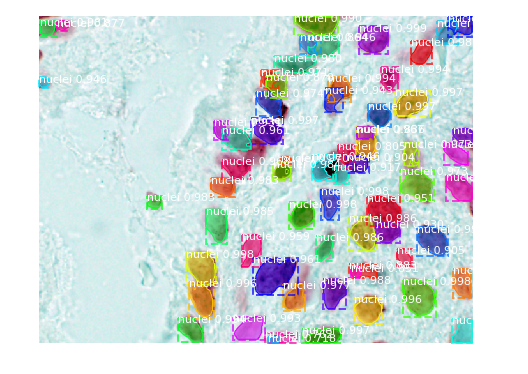

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


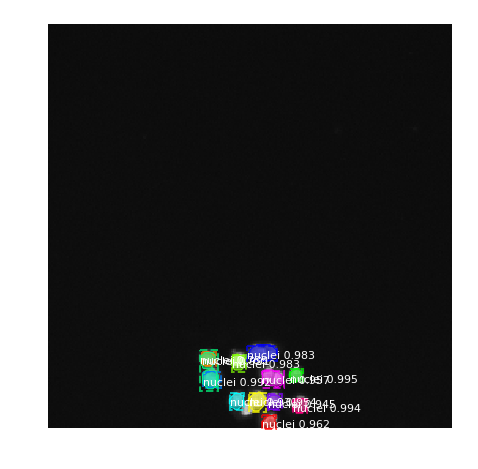

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


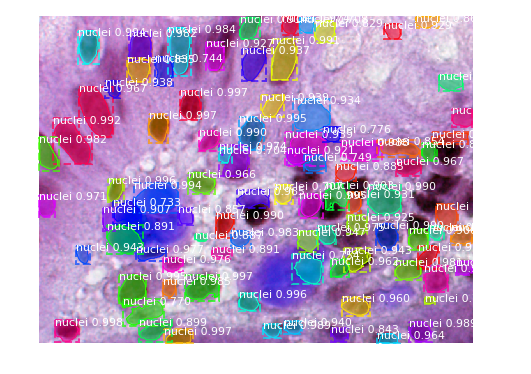

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


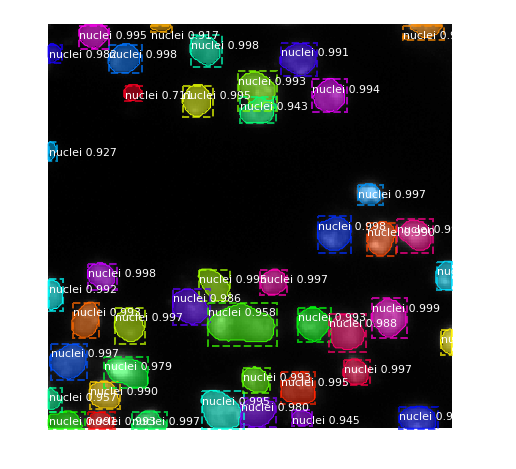

Processing 1 images
image                    shape: (390, 239, 3)         min:    0.00000  max:   81.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   79.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  465.00000


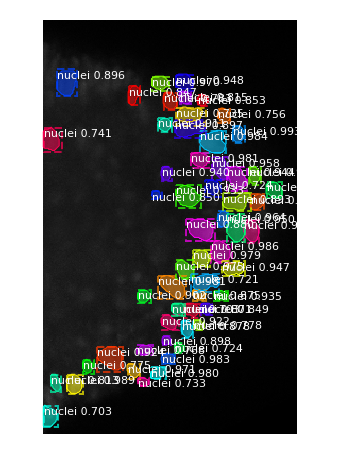

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  109.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   97.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


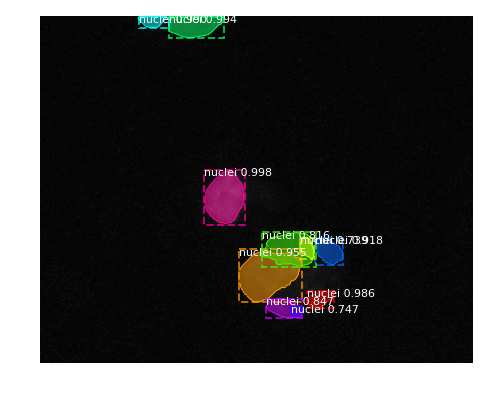

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:  121.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  121.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


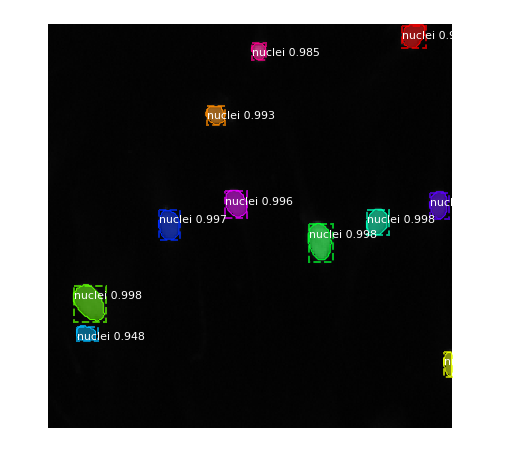

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


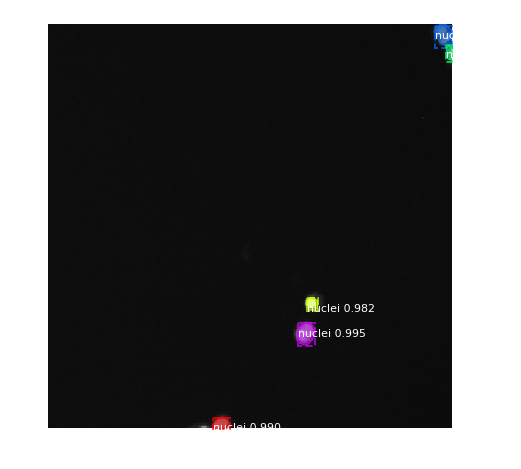

Processing 1 images
image                    shape: (260, 347, 3)         min:   26.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  429.00000


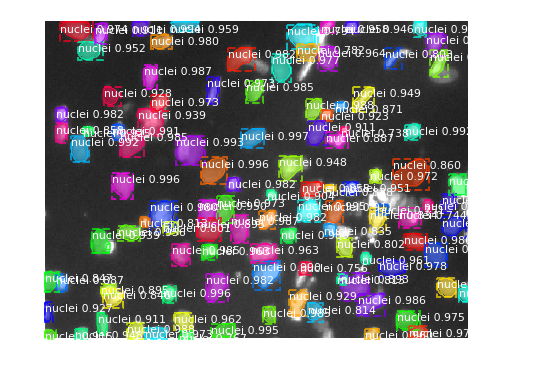

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   93.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   93.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


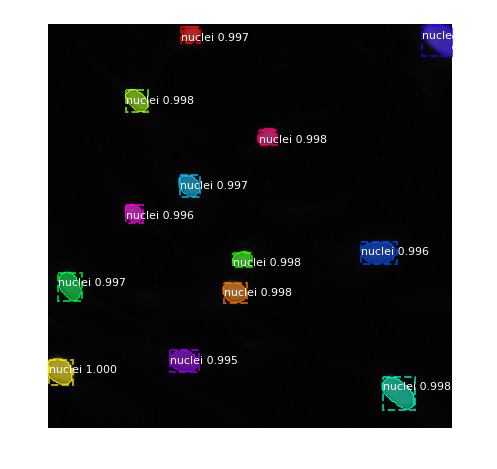

Processing 1 images
image                    shape: (520, 348, 3)         min:    3.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


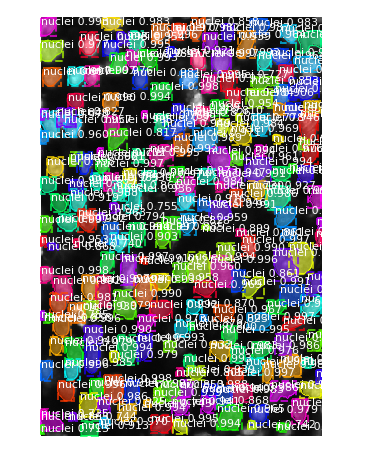

Processing 1 images
image                    shape: (512, 640, 3)         min:    1.00000  max:  153.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  138.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


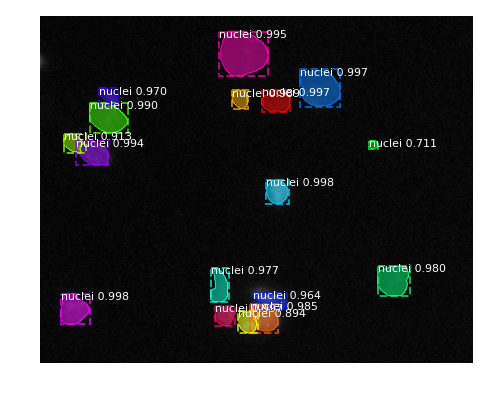

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


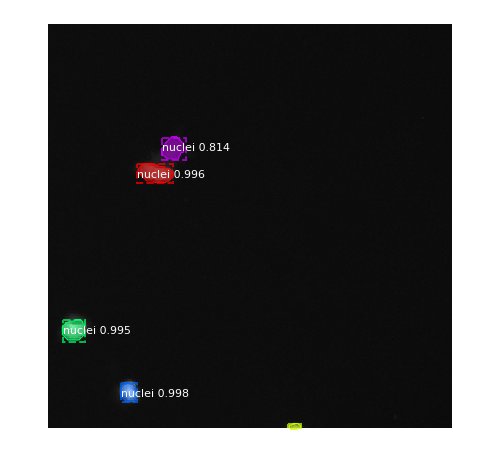

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


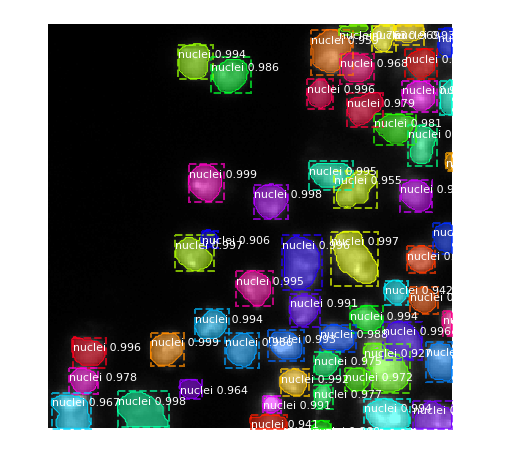

Processing 1 images
image                    shape: (260, 347, 3)         min:   28.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  429.00000


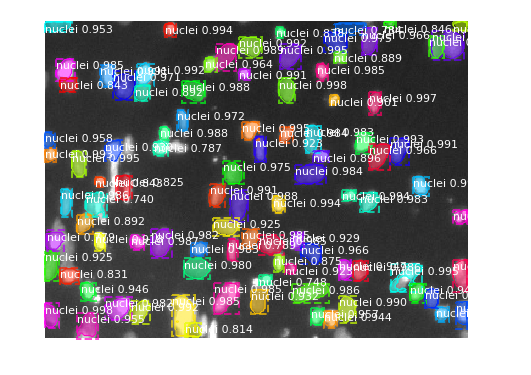

Processing 1 images
image                    shape: (520, 348, 3)         min:    3.00000  max:  186.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  185.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


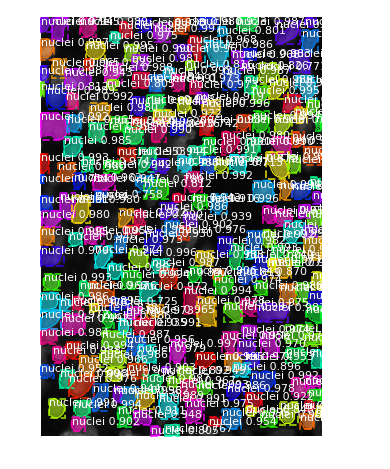

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  177.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  151.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


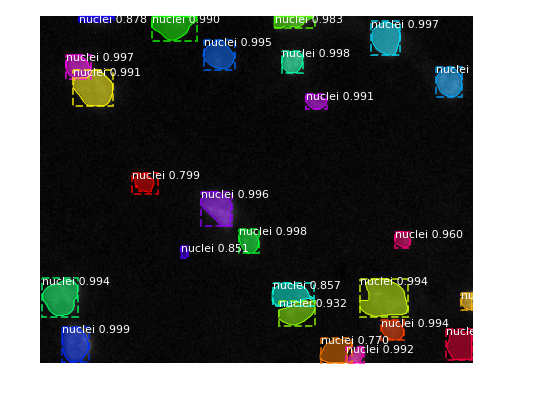

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  245.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  245.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


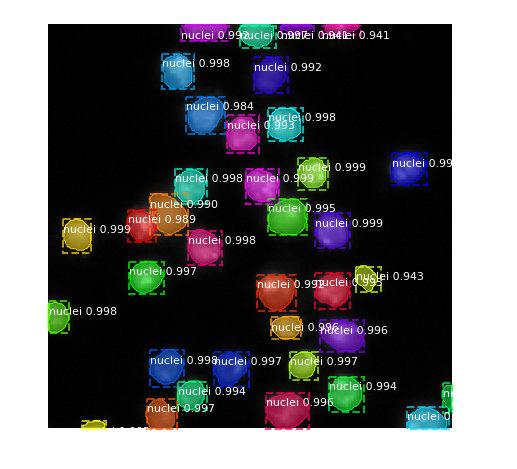

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  186.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  175.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


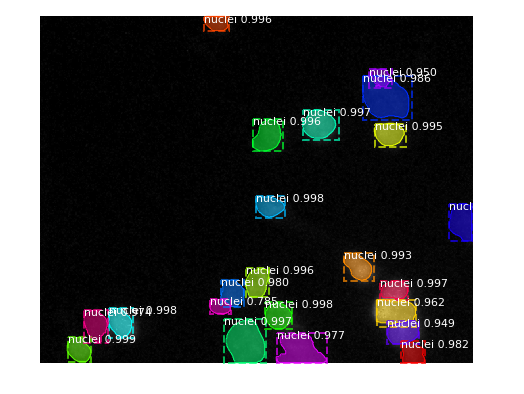

Processing 1 images
image                    shape: (520, 696, 3)         min:   10.00000  max:  237.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  237.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


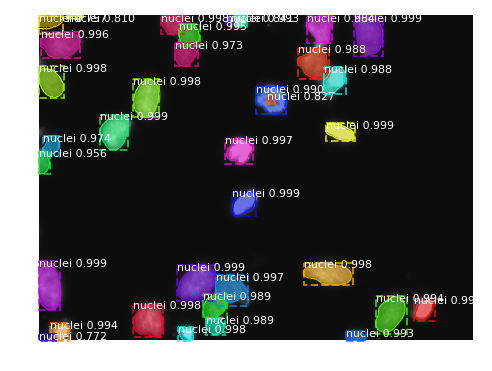

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


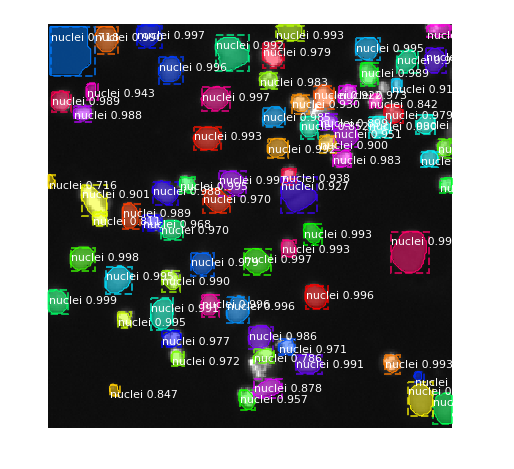

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  109.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   95.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


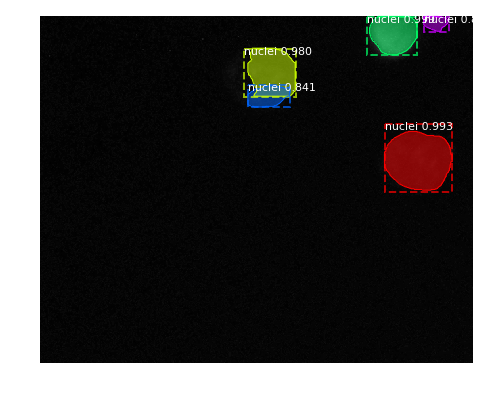

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


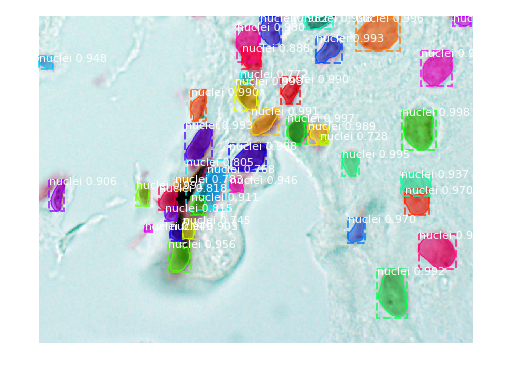

Processing 1 images
image                    shape: (519, 253, 3)         min:    9.00000  max:  101.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   98.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


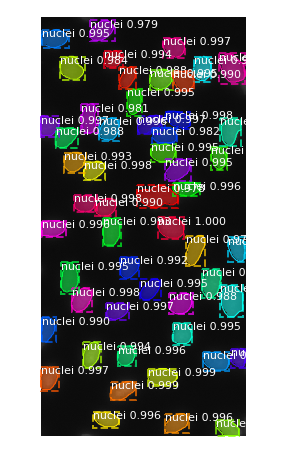

Processing 1 images
image                    shape: (519, 161, 3)         min:    5.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


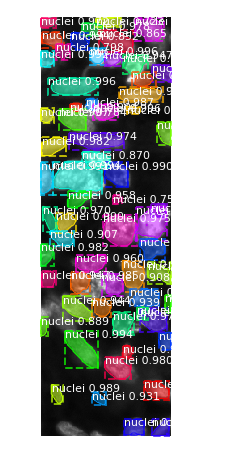

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:   89.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   89.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


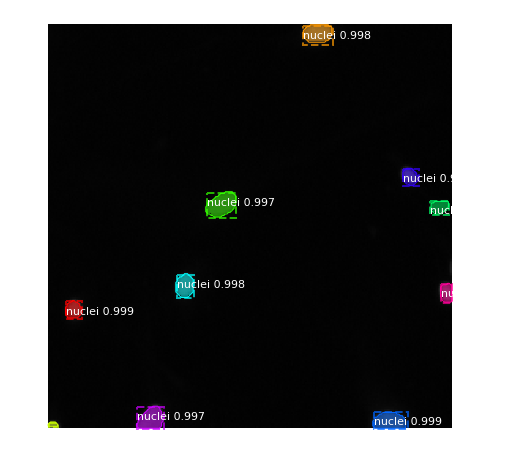

Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  225.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  224.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


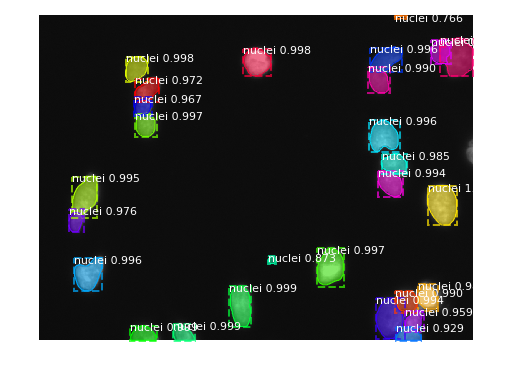

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  253.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


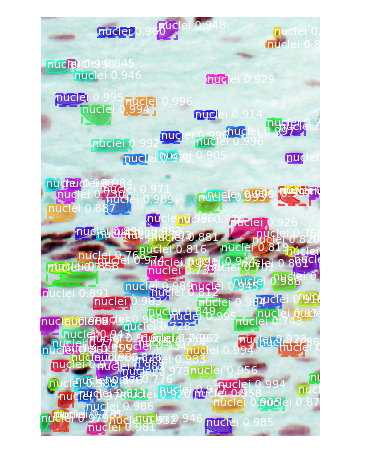

Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  230.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  230.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


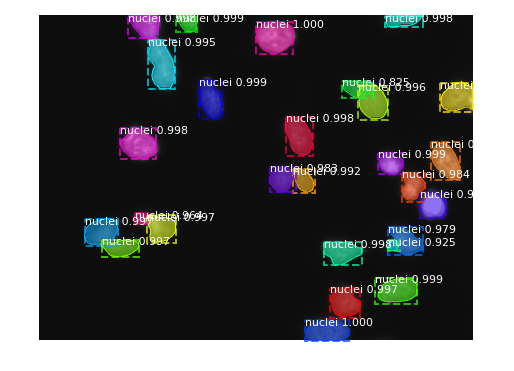

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


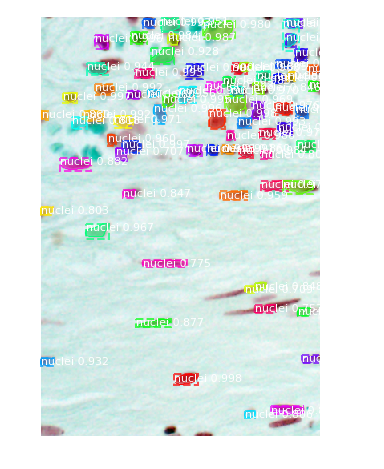

Processing 1 images
image                    shape: (519, 161, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


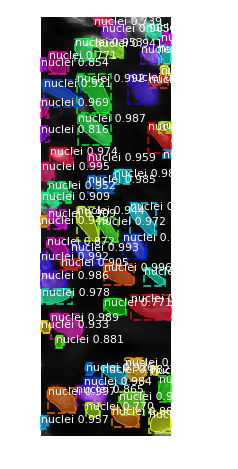

Processing 1 images
image                    shape: (519, 162, 3)         min:    3.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


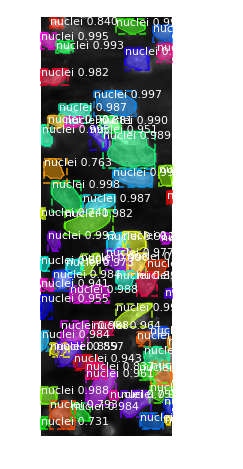

Processing 1 images
image                    shape: (520, 348, 3)         min:    0.00000  max:  201.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  195.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


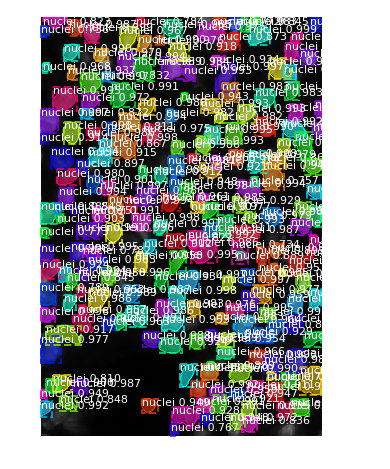

Processing 1 images
image                    shape: (256, 256, 3)         min:    8.00000  max:  192.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  192.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


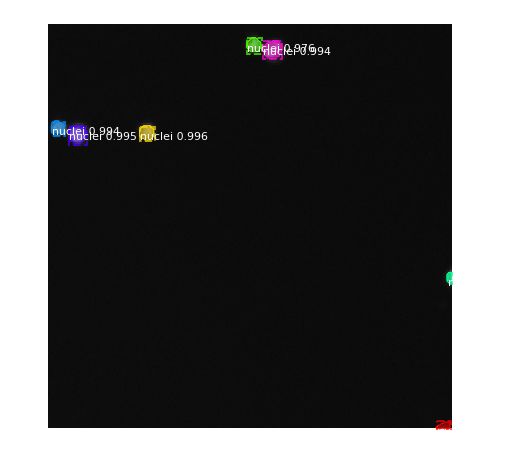

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


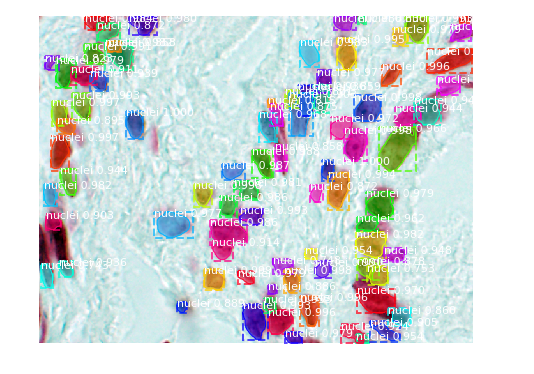

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   95.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   95.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


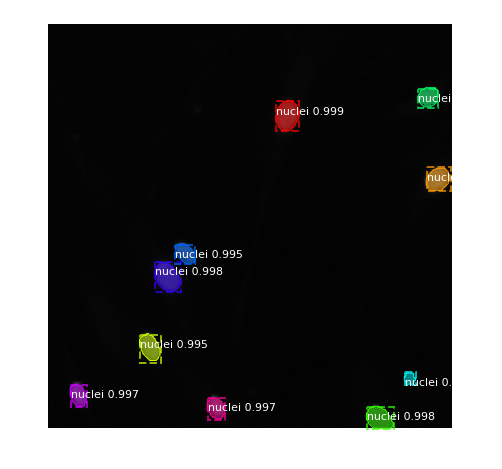

Processing 1 images
image                    shape: (260, 347, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  429.00000


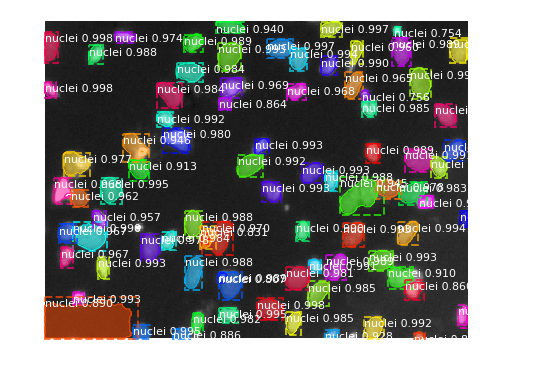

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   82.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:   82.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


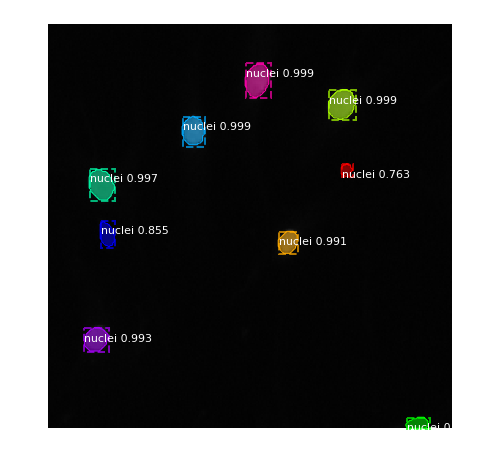

Processing 1 images
image                    shape: (519, 253, 3)         min:   10.00000  max:  225.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  224.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


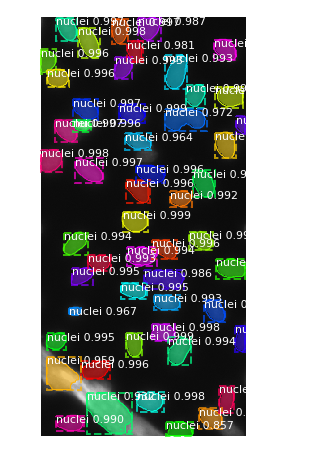

Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  222.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  221.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


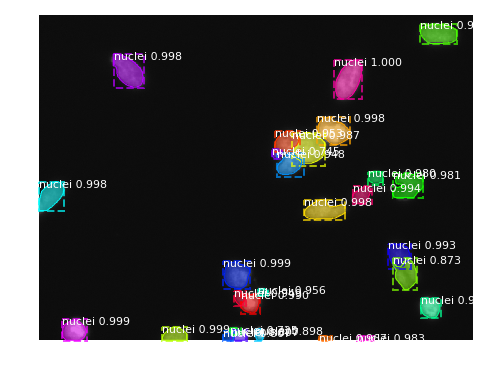

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


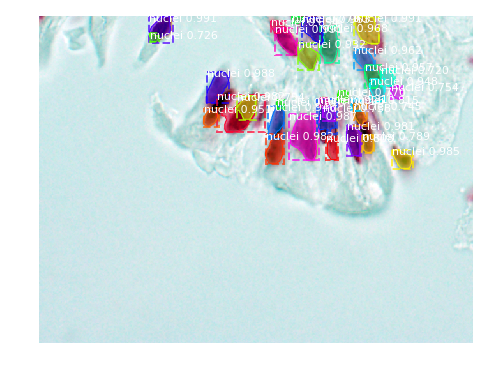

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


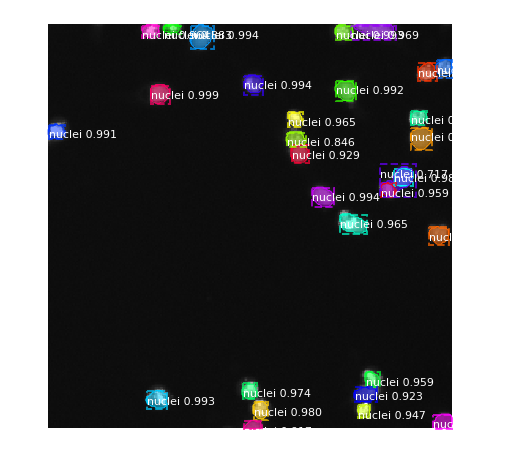

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  384.00000


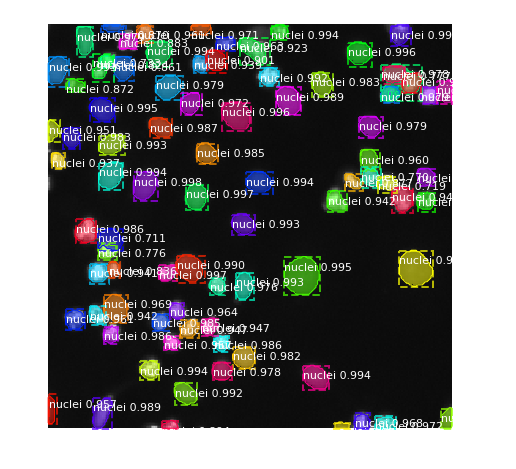

In [5]:
output = []

for image_id in sample_submission.ImageId:
    image_path = os.path.join('stage1_test', image_id, 'images', image_id + '.png')
    
    original_image = cv2.imread(image_path)
    results = model.detect([original_image], verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                ['', 'nuclei'], r['scores'], ax=get_ax())